# Amazon Titan Image Generator - DEMO

> Amazon Bedrock의 Titan Image Generator 멀티모달 FM을 실습합니다. <br>
> 2023년 11월 30일 기준 us-west-2 에서 작동합니다.

* 2023년 11월 29일 re:Invent 2023에서 2개의 새로운 Amazon Titan 멀티모달 FM이 소개되었습니다.
* Amazon Image Generator (preview) 및 Amazon Titan multimodal embedding 입니다.


<b> Amazon Image Generator (Preview) </b> <br>
이제 Amazon Titan Image Generator를 사용하여 (English) 프롬프트를 사용하여 이미지를 빠르게 생성하고 다듬을 수 있습니다.<br>
이를 통해 광고, 전자상거래, 미디어 및 엔터테인먼트 분야의 기업들은 스튜디오 품질의 사실적인 이미지를 저렴한 비용으로 대량으로 제작할 수 있습니다. <br>
Amazon Image Generator 모델을 사용하면 텍스트 설명을 기반으로 여러 이미지 옵션을 생성하여 이미지 컨셉을 쉽게 반복할 수 있습니다. <br>
Amazon Image Generator 모델은 여러 개체가 포함된 복잡한 프롬프트를 이해하고 관련 이미지를 생성할 수 있습니다. <br>
고품질의 다양한 데이터로 학습되어 포괄적인 속성과 왜곡이 제한된 사실적인 이미지와 같은 보다 정확한 결과물을 생성합니다.

## Setup

In [2]:
%pip install --quiet "pillow>=9.5,<10"


[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [3]:
# Python Built-Ins:
import base64
import io
import json
import os
import sys
import time

# External Dependencies:
import boto3
from PIL import Image

module_path = "."
sys.path.append(os.path.abspath(module_path))
from utils import bedrock, print_ww


# ---- ⚠️ Un-comment and edit the below lines as needed for your AWS setup ⚠️ ----

# os.environ["AWS_DEFAULT_REGION"] = "<REGION_NAME>"  # E.g. "us-east-1"
# os.environ["AWS_PROFILE"] = "<YOUR_PROFILE>"
# os.environ["BEDROCK_ASSUME_ROLE"] = "<YOUR_ROLE_ARN>"  # E.g. "arn:aws:..."

boto3_bedrock = bedrock.get_bedrock_client(
    assumed_role=os.environ.get("BEDROCK_ASSUME_ROLE", None),
    region=os.environ.get("AWS_DEFAULT_REGION", None),
)

bedrock_runtime = boto3.client(service_name="bedrock-runtime")

Create new client
  Using region: us-west-2
boto3 Bedrock client successfully created!
bedrock-runtime(https://bedrock-runtime.us-west-2.amazonaws.com)


## Text-to-Image

### Example 1 : green iguana

In [4]:
prompt = "green iguana"

#negative_prompts = "poorly rendered, poor background details"


In [5]:
body = json.dumps(
    {
        "taskType": "TEXT_IMAGE",
        "textToImageParams": {
            "text": prompt,   # Required
#            "negativeText": negative_prompts  # Optional
        },
        "imageGenerationConfig": {
            "numberOfImages": 1,   # Range: 1 to 5 
            "quality": "premium",  # Options: standard or premium
            "height": 768,         # Supported height list in the docs 
            "width": 1280,         # Supported width list in the docs
            "cfgScale": 7.5,       # Range: 1.0 (exclusive) to 10.0
            "seed": 42             # Range: 0 to 214783647
        }
    }
)

response = bedrock_runtime.invoke_model(
    body = body, 
    modelId = "amazon.titan-image-generator-v1",
    accept = "application/json", 
    contentType = "application/json"
)

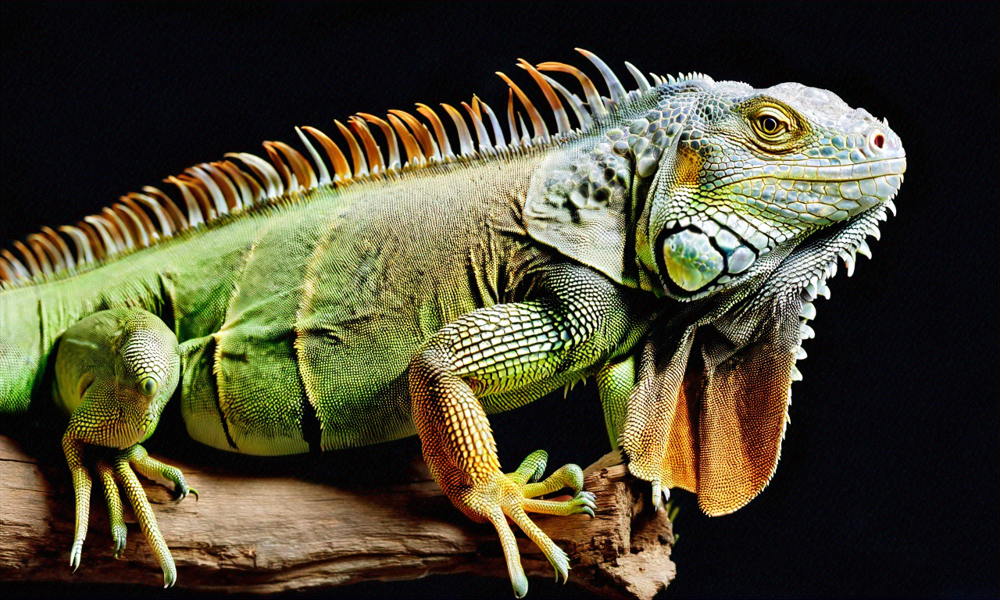

In [6]:
import base64
from PIL import Image
from io import BytesIO

response_body = json.loads(response.get("body").read())
images = [Image.open(BytesIO(base64.b64decode(base64_image))) for base64_image in response_body.get("images")]

for img in images:
    display(img)

### Example 2 : a Bag (product concept)

In [7]:
prompt = "The Bag is a small sports weekender bag suitable for exercise or outdoor activities, and uses a luxurious and solid fabric with a subtle gloss to create a casual yet luxurious mood. It is easy to store small belongings and various pockets are provided."

negative_prompts = "poorly rendered, poor background details, poorly drawn bag, poorly drawn background"


In [8]:
body = json.dumps(
    {
        "taskType": "TEXT_IMAGE",
        "textToImageParams": {
            "text": prompt,   # Required
            "negativeText": negative_prompts  # Optional
        },
        "imageGenerationConfig": {
            "numberOfImages": 1,   # Range: 1 to 5 
            "quality": "premium",  # Options: standard or premium
            "height": 768,         # Supported height list in the docs 
            "width": 1280,         # Supported width list in the docs
            "cfgScale": 7.5,       # Range: 1.0 (exclusive) to 10.0
            "seed": 42             # Range: 0 to 214783647
        }
    }
)

response = bedrock_runtime.invoke_model(
    body = body, 
    modelId = "amazon.titan-image-generator-v1",
    accept = "application/json", 
    contentType = "application/json"
)

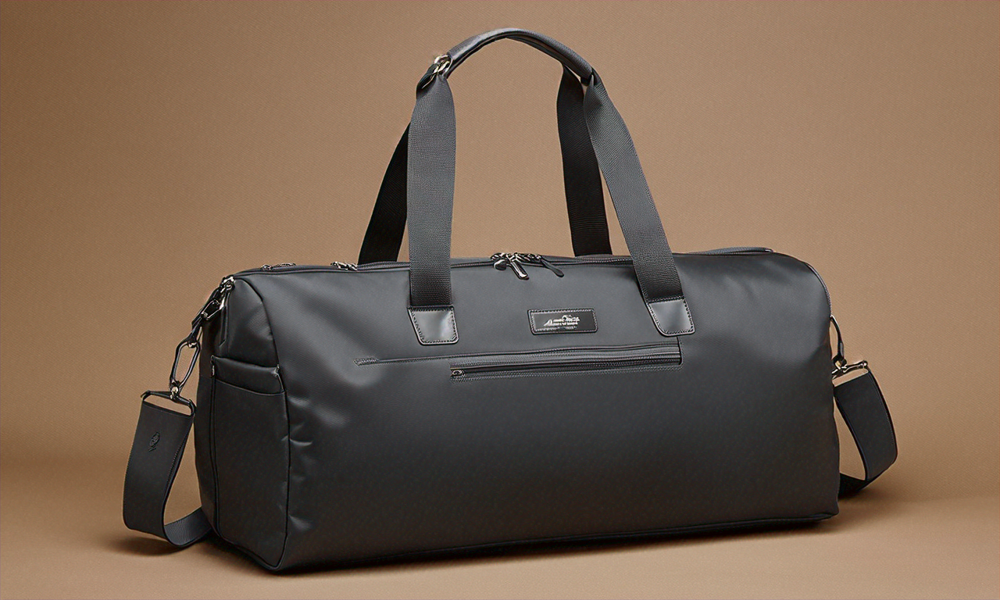

In [9]:
import base64
from PIL import Image
from io import BytesIO

response_body = json.loads(response.get("body").read())
images = [Image.open(BytesIO(base64.b64decode(base64_image))) for base64_image in response_body.get("images")]

for img in images:
    display(img)

### Example 3 : fashion model (virtual model)

In [10]:
prompt = "RAW photo, a korean woman wearing a white t - shirt and black pants with a bear printing on it, (high detailed skin:1.2), 8k uhd, dslr, soft lighting, high quality, film grain, Fujifilm XT3"

negative_prompts = "deformed iris, deformed pupils, semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime:1.4, text, close up, cropped, out of frame, worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, extra fingers, mutated hands, poorly drawn hands, poorly drawn face, mutation, deformed, blurry, dehydrated, bad anatomy, extra arms, extra legs, fused fingers, too many fingers, long neck, poor hands"


In [11]:
body = json.dumps(
    {
        "taskType": "TEXT_IMAGE",
        "textToImageParams": {
            "text": prompt,   # Required
            "negativeText": negative_prompts  # Optional
        },
        "imageGenerationConfig": {
            "numberOfImages": 1,   # Range: 1 to 5 
            "quality": "premium",  # Options: standard or premium
            "height": 768,         # Supported height list in the docs 
            "width": 1280,         # Supported width list in the docs
            "cfgScale": 7.5,       # Range: 1.0 (exclusive) to 10.0
            "seed": 15             # Range: 0 to 214783647
        }
    }
)

response = bedrock_runtime.invoke_model(
    body = body, 
    modelId = "amazon.titan-image-generator-v1",
    accept = "application/json", 
    contentType = "application/json"
)

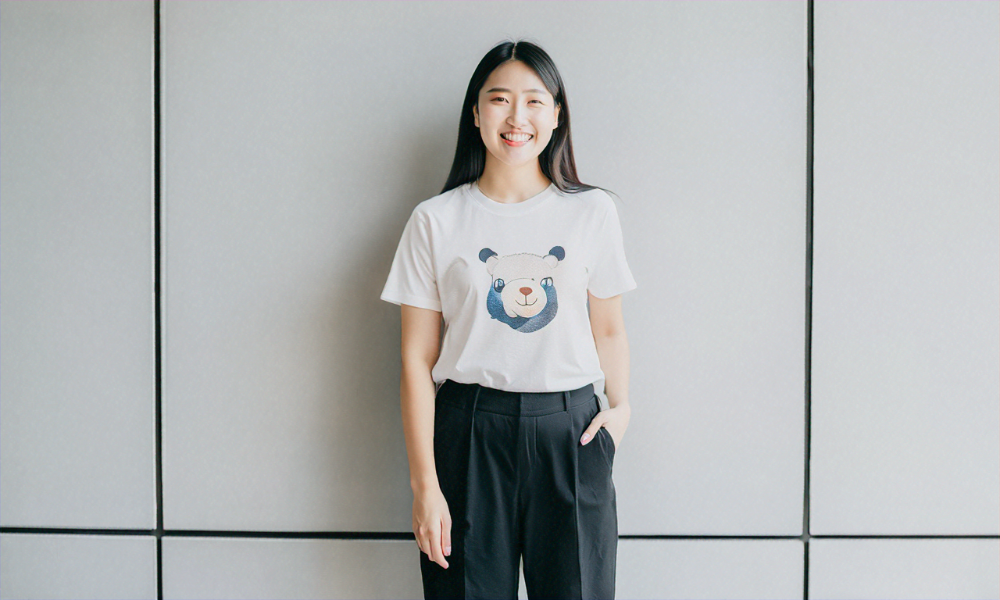

In [12]:
import base64
from PIL import Image
from io import BytesIO

response_body = json.loads(response.get("body").read())
images = [Image.open(BytesIO(base64.b64decode(base64_image))) for base64_image in response_body.get("images")]

for img in images:
    display(img)

### Example 4 : fresh & appetizing beef (promotion, marketing)

In [15]:
prompt = "A fresh and appetizing beef image for a flyer, showcasing the high quality and freshness of the meat, with vibrant colors and a clean, appealing presentation. The beef should look tender and juicy, suitable for high-quality culinary use. The image should be attractive and make the beef the central focus, ideal for marketing and promotional purposes."

negative_prompts = "Avoid making the beef look overcooked, dry, or unappetizing. Do not include any background elements that might distract from the main focus, such as busy patterns or irrelevant objects. Exclude any imagery suggesting processed or unhealthy food. Avoid unrealistic or cartoonish representations of the beef. Do not use dull or muted colors that might make the beef appear less fresh."


In [26]:
body = json.dumps(
    {
        "taskType": "TEXT_IMAGE",
        "textToImageParams": {
            "text": prompt,   # Required
            "negativeText": negative_prompts  # Optional
        },
        "imageGenerationConfig": {
            "numberOfImages": 1,   # Range: 1 to 5 
            "quality": "premium",  # Options: standard or premium
            "height": 768,         # Supported height list in the docs 
            "width": 1280,         # Supported width list in the docs
            "cfgScale": 7.5,       # Range: 1.0 (exclusive) to 10.0
            "seed": 20             # Range: 0 to 214783647
        }
    }
)

response = bedrock_runtime.invoke_model(
    body = body, 
    modelId = "amazon.titan-image-generator-v1",
    accept = "application/json", 
    contentType = "application/json"
)

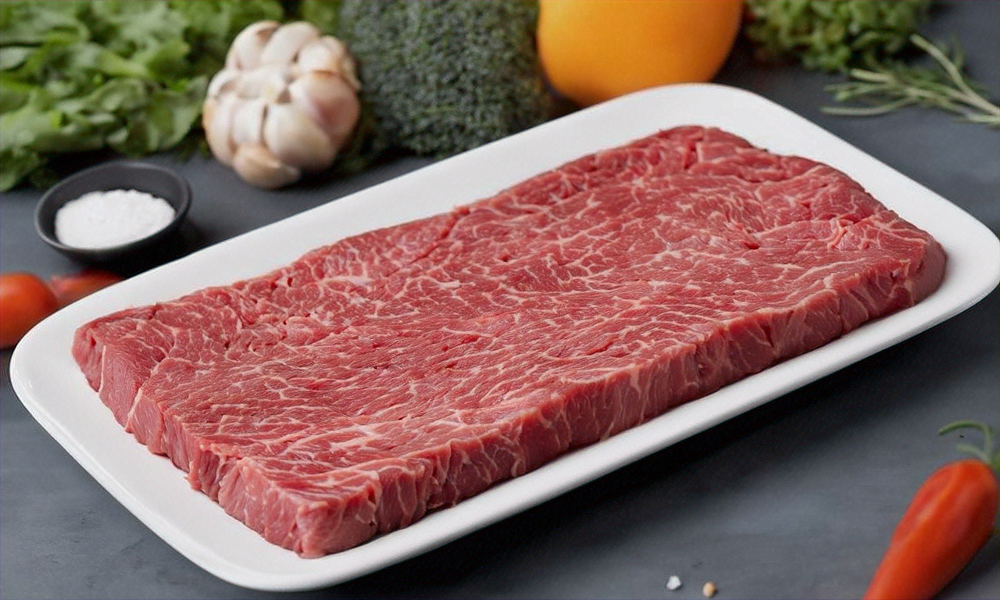

In [27]:
import base64
from PIL import Image
from io import BytesIO

response_body = json.loads(response.get("body").read())
images = [Image.open(BytesIO(base64.b64decode(base64_image))) for base64_image in response_body.get("images")]

for img in images:
    display(img)

### Example 5 : Korean style ramen (promotion, marketing)

In [35]:
prompt = "Delicious Korean ramen with a deep red broth, chewy noodles, and fresh toppings (boiled egg, kimchi, spring onions, sprouts), set in a warm and inviting atmosphere, with bright and warm lighting and colors."

negative_prompts = "Avoid blurry images, dark lighting, unrealistic colors, overly decorated toppings, excessively greasy broth, overly dry noodles, and faded toppings."


In [48]:
body = json.dumps(
    {
        "taskType": "TEXT_IMAGE",
        "textToImageParams": {
            "text": prompt,   # Required
            "negativeText": negative_prompts  # Optional
        },
        "imageGenerationConfig": {
            "numberOfImages": 1,   # Range: 1 to 5 
            "quality": "premium",  # Options: standard or premium
            "height": 768,         # Supported height list in the docs 
            "width": 1280,         # Supported width list in the docs
            "cfgScale": 7.5,       # Range: 1.0 (exclusive) to 10.0
            "seed": 40             # Range: 0 to 214783647
        }
    }
)

response = bedrock_runtime.invoke_model(
    body = body, 
    modelId = "amazon.titan-image-generator-v1",
    accept = "application/json", 
    contentType = "application/json"
)

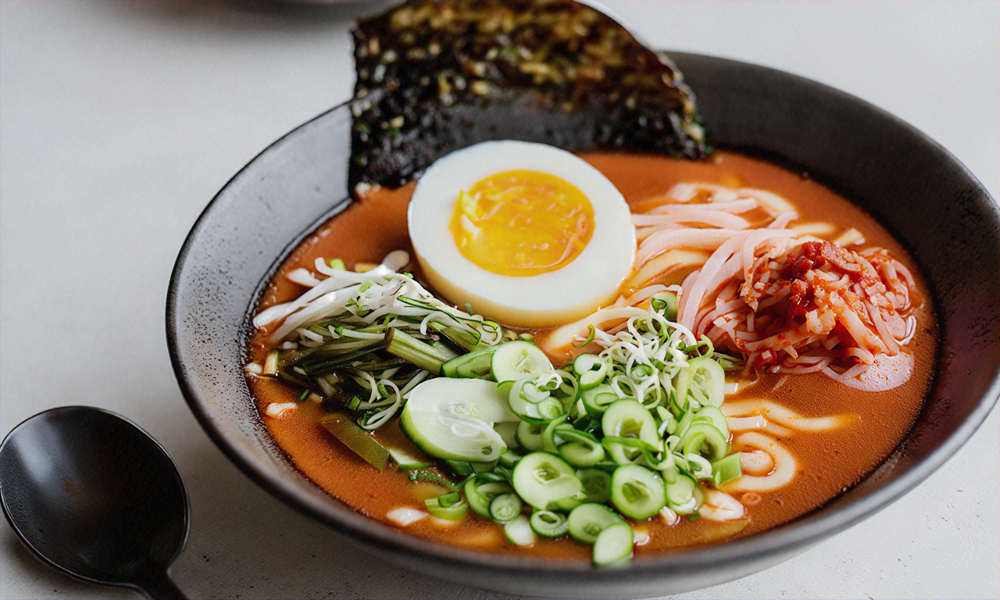

In [49]:
import base64
from PIL import Image
from io import BytesIO

response_body = json.loads(response.get("body").read())
images = [Image.open(BytesIO(base64.b64decode(base64_image))) for base64_image in response_body.get("images")]

for img in images:
    display(img)

---
## Image-to-Image

<i> 리인벤트 이후 Image-to-Image, In/Out Painting 등 다양한 파라미터가 공개되면 추가

### Example 1 : sweater design

In [ ]:
from PIL import Image

def resize_image(image, width, height):
    return image.resize((width, height), Image.BICUBIC)


os.makedirs("data", exist_ok=True)

apparel = resize_image(Image.open('data/apparel.jpg').convert("RGB"), 768, 320)

apparel


In [ ]:
# 원본 이미지를 basse64 인코딩으로 변환
def image_to_base64(img) -> str:
    """Convert a PIL Image or local image file path to a base64 string for Amazon Bedrock"""
    if isinstance(img, str):
        if os.path.isfile(img):
            print(f"Reading image from file: {img}")
            with open(img, "rb") as f:
                return base64.b64encode(f.read()).decode("utf-8")
        else:
            raise FileNotFoundError(f"File {img} does not exist")
    elif isinstance(img, Image.Image):
        print("Converting PIL Image to base64 string")
        buffer = io.BytesIO()
        img.save(buffer, format="PNG")
        return base64.b64encode(buffer.getvalue()).decode("utf-8")
    else:
        raise ValueError(f"Expected str (filename) or PIL Image. Got {type(img)}")


init_image_b64 = image_to_base64(apparel)
print(init_image_b64[:80] + "...")

In [ ]:
# Prompt
prompt = "a cat face picture in a sweater"

negative_prompts = "poorly rendered, poor sweater detail"


In [ ]:
"""
body = json.dumps(
    {
        "taskType": "IMAGE_IMAGE",
        "textToImageParams": {
            "text": prompt,   # Required
            "negativeText": negative_prompts  # Optional
        },
        "imageGenerationConfig": {
            "numberOfImages": 1,   # Range: 1 to 5 
            "quality": "premium",  # Options: standard or premium
            "height": 768,         # Supported height list in the docs 
            "width": 1280,         # Supported width list in the docs
            "cfgScale": 7.5,       # Range: 1.0 (exclusive) to 10.0
            "seed": 20,            # Range: 0 to 214783647
            "init_image": init_image_b64,
            "image_strength": 0.8
        }
    }
)

response = bedrock_runtime.invoke_model(
    body = body, 
    modelId = "amazon.titan-image-generator-v1",
    accept = "application/json", 
    contentType = "application/json"
)
"""

In [ ]:
"""
import base64
from PIL import Image
from io import BytesIO

response_body = json.loads(response.get("body").read())
images = [Image.open(BytesIO(base64.b64decode(base64_image))) for base64_image in response_body.get("images")]

for img in images:
    display(img)
"""